In [29]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import glob
import math

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw


In [30]:
# This is needed to display the images.
%matplotlib inline

# This is needed.
sys.path.append('./Tensorflow_object_detection/research/object_detection/')
sys.path.append('./Tensorflow_object_detection/research/')

In [31]:
from utils import label_map_util

from utils import visualization_utils as vis_util

In [32]:
PATH_TO_CKPT = './saved_models/saved_model_faster_RCNN_inception/frozen_inference_graph.pb'
PATH_TO_LABELS = './data/object-detection.pbtxt'

NUM_CLASSES = 2

In [33]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [34]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [35]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [202]:
PATH_TO_TEST_IMAGES_DIR = 'test_images'
TEST_IMAGE_PATHS = glob.glob(PATH_TO_TEST_IMAGES_DIR+'/*')

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

In [203]:
def indices(a, func):
    return [i for (i, val) in enumerate(a) if func(val)]
def size2key(a):
    return((a==0)*16 or (a==1)*17 or (a==2)*18 or (a==3)*19 or (a==4)*22 or (a==5)*24)

test_images\16_17_18_22_24_19_L_H_L_L_L_L_0594_0_5053.png
Pos 1 length: 261.94. Predicted as 16, true value was 16.
Pos 2 length: 280.83. Predicted as 17, true value was 17.
Pos 3 length: 296.92. Predicted as 18, true value was 18.
Pos 4 length: 328.07. Predicted as 22, true value was 22.
Pos 5 length: 375.34. Predicted as 24, true value was 24.
Pos 6 length: 322.53. Predicted as 19, true value was 19.

Accuracy was 100.00%

--------------------------------------------------------

test_images\16_18_19_17_24_22_L_L_L_H_H_L_0786_0_4049.png
Pos 1 length: 266.66. Predicted as 16, true value was 16.
Pos 2 length: 304.13. Predicted as 19, true value was 18.
Pos 3 length: 301.50. Predicted as 18, true value was 19.
Pos 4 length: 298.91. Predicted as 17, true value was 17.
Pos 5 length: 413.64. Predicted as 24, true value was 24.
Pos 6 length: 350.33. Predicted as 22, true value was 22.

Accuracy was 66.67%

--------------------------------------------------------

test_images\16_18_22_17_24_

c:\02456_deeplearning\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


test_images\17_24_22_18_19_16_H_L_L_L_L_H_0831_0_240.png
Pos 1 length: 297.62. Predicted as 17, true value was 17.
Pos 2 length: 397.23. Predicted as 24, true value was 24.
Pos 3 length: 368.17. Predicted as 22, true value was 22.
Pos 4 length: 316.28. Predicted as 18, true value was 18.
Pos 5 length: 323.26. Predicted as 19, true value was 19.
Pos 6 length: 288.29. Predicted as 16, true value was 16.

Accuracy was 100.00%

--------------------------------------------------------

test_images\18_16_17_24_22_19_H_H_H_H_L_L_0726_0_1492.png
Pos 1 length: 246.99. Predicted as 18, true value was 18.
Pos 2 length: 226.82. Predicted as 16, true value was 16.
Pos 3 length: 237.29. Predicted as 17, true value was 17.
Pos 4 length: 324.76. Predicted as 24, true value was 24.
Pos 5 length: 292.01. Predicted as 22, true value was 22.
Pos 6 length: 270.54. Predicted as 19, true value was 19.

Accuracy was 100.00%

--------------------------------------------------------

test_images\18_16_19_22_24_

test_images\19_24_16_18_22_17_L_L_L_H_L_L_15_0_4828.png
Pos 1 length: 282.33. Predicted as 19, true value was 19.
Pos 2 length: 345.08. Predicted as 24, true value was 24.
Pos 3 length: 248.54. Predicted as 16, true value was 16.
Pos 4 length: 280.31. Predicted as 18, true value was 18.
Pos 5 length: 318.55. Predicted as 22, true value was 22.
Pos 6 length: 261.20. Predicted as 17, true value was 17.

Accuracy was 100.00%

--------------------------------------------------------

test_images\22_16_24_18_17_19_H_L_H_H_H_L_133_0_9298.png
Pos 1 length: 208.46. Predicted as 22, true value was 22.
Pos 2 length: 155.70. Predicted as 16, true value was 16.
Pos 3 length: 225.02. Predicted as 24, true value was 24.
Pos 4 length: 168.73. Predicted as 18, true value was 18.
Pos 5 length: 163.70. Predicted as 17, true value was 17.
Pos 6 length: 172.78. Predicted as 19, true value was 19.

Accuracy was 100.00%

--------------------------------------------------------

test_images\22_19_24_17_16_18

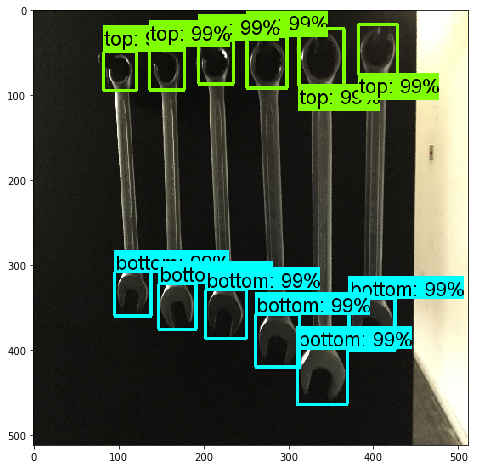

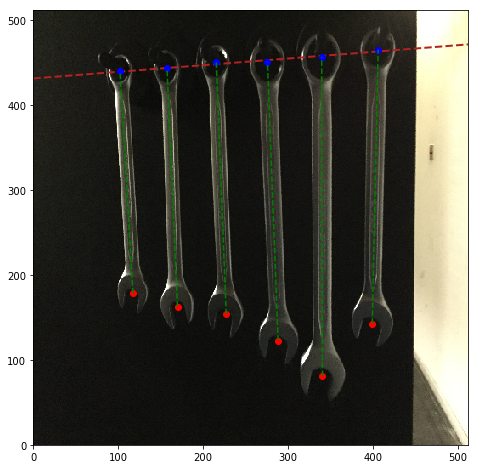

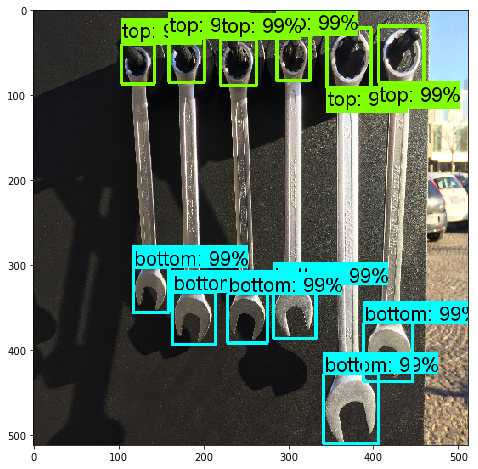

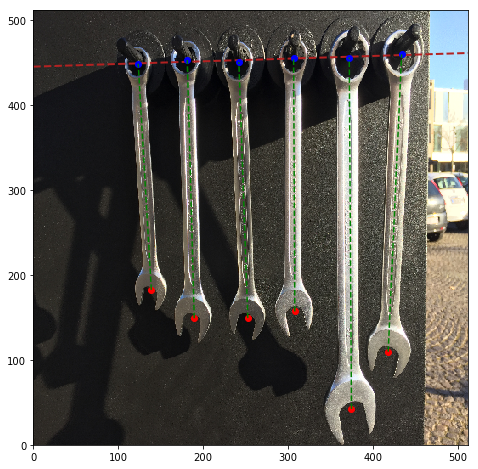

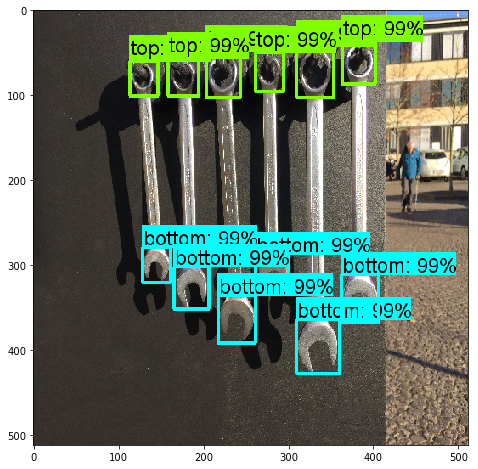

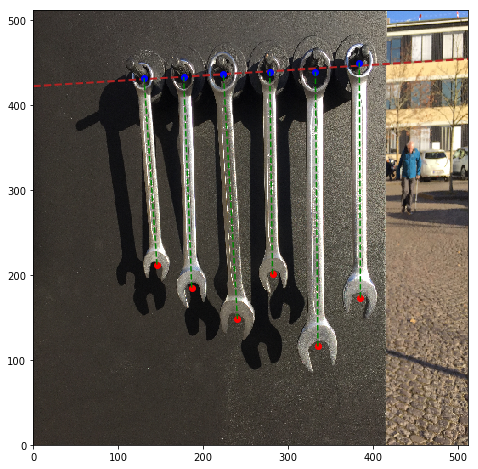

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


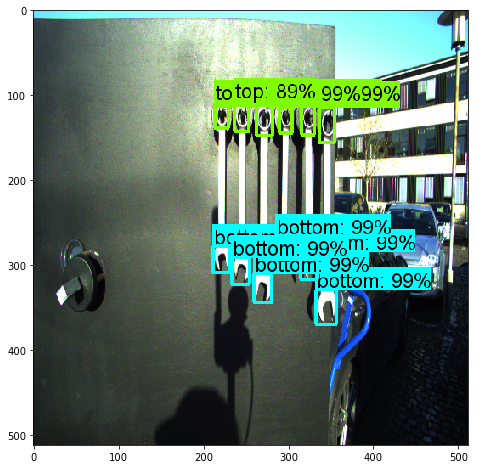

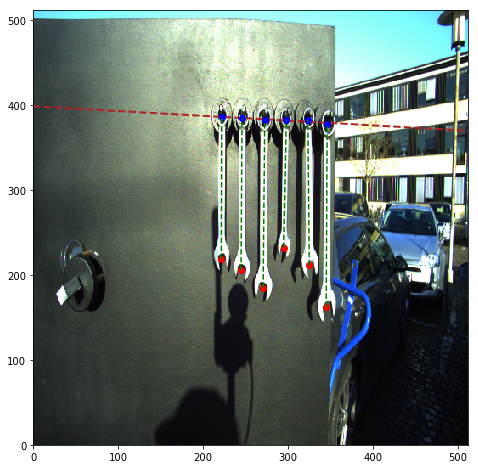

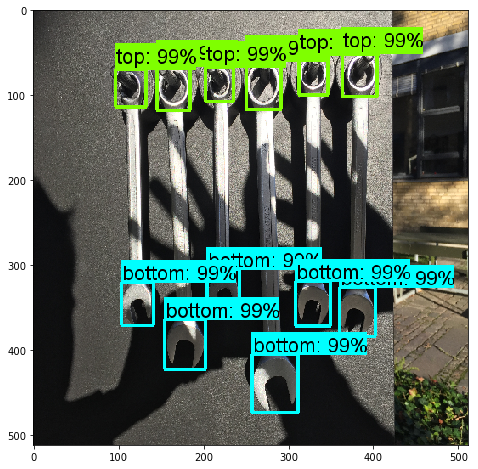

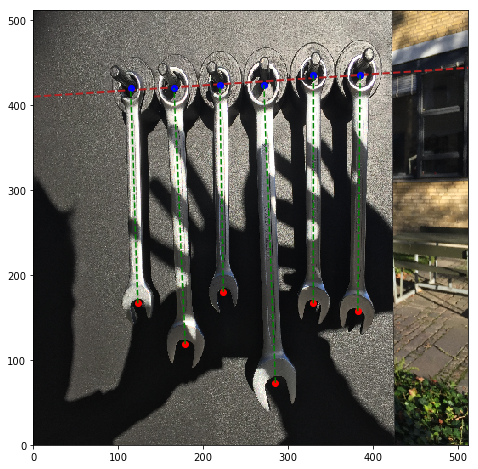

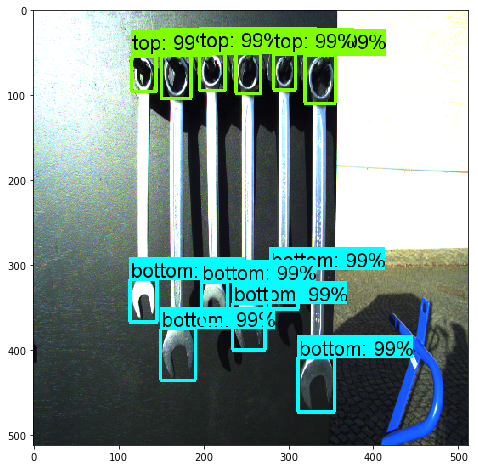

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


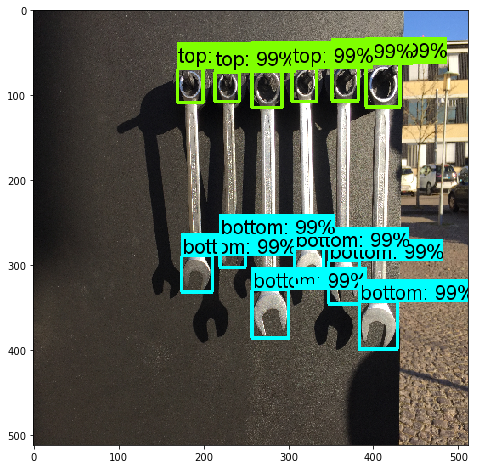

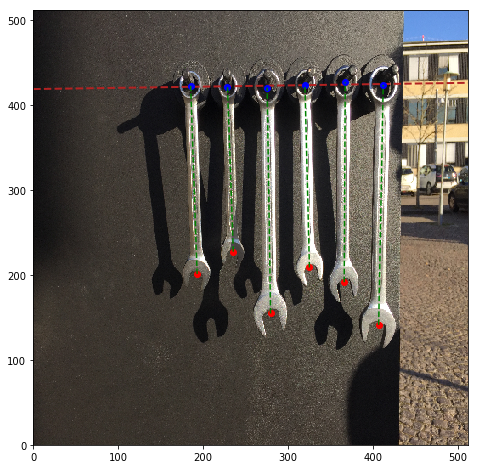

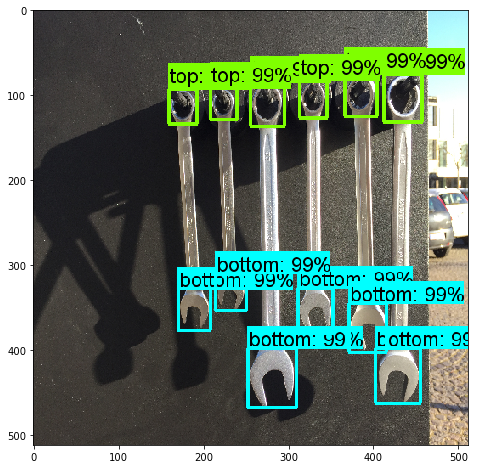

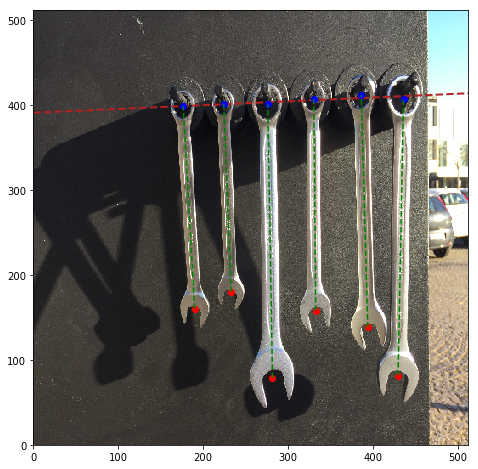

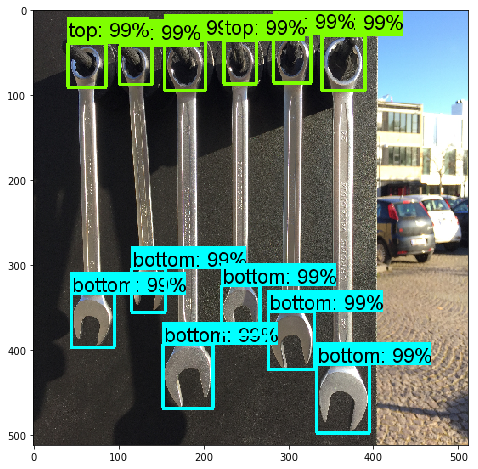

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


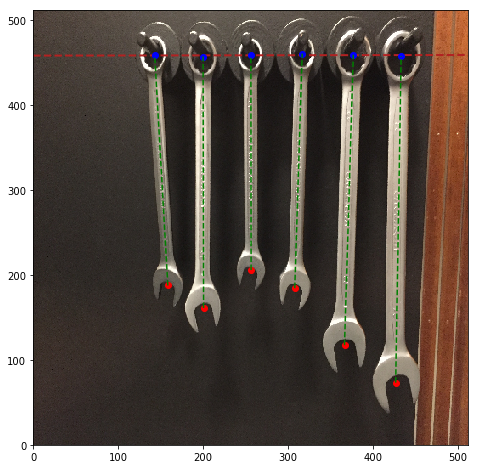

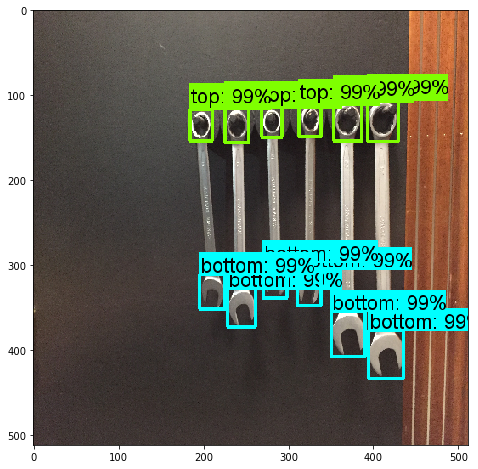

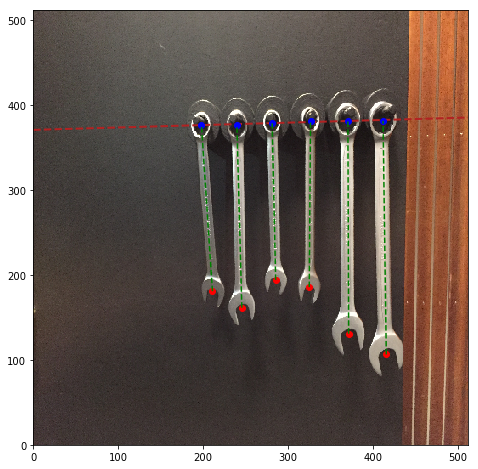

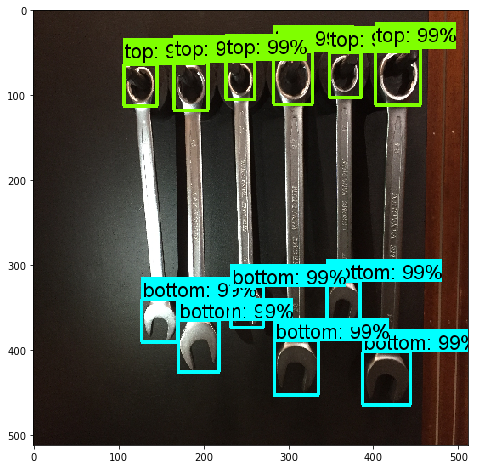

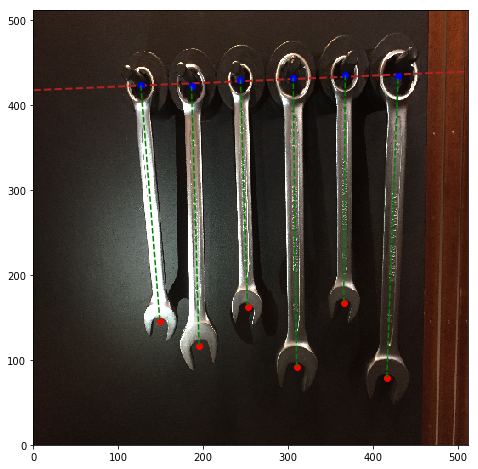

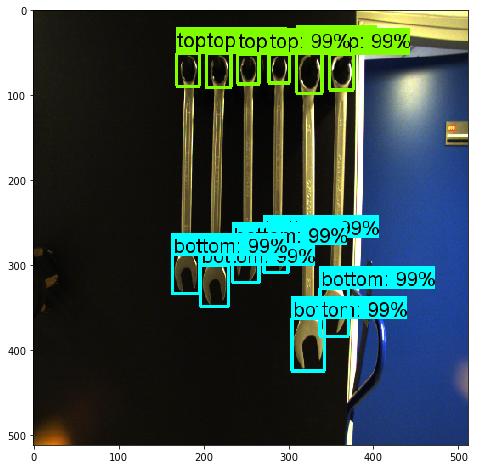

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


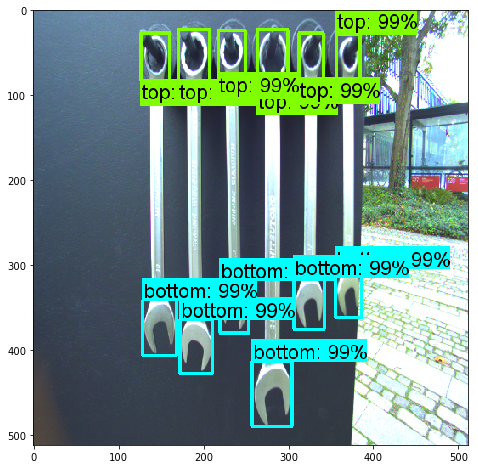

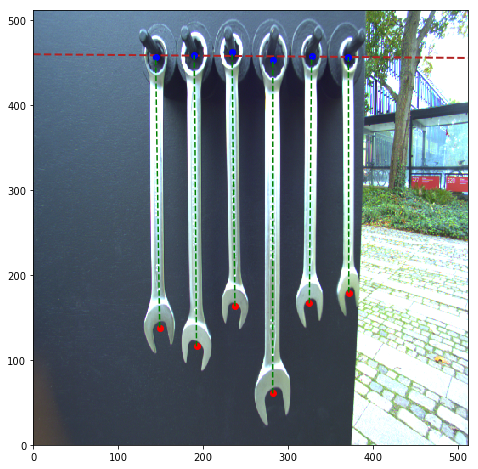

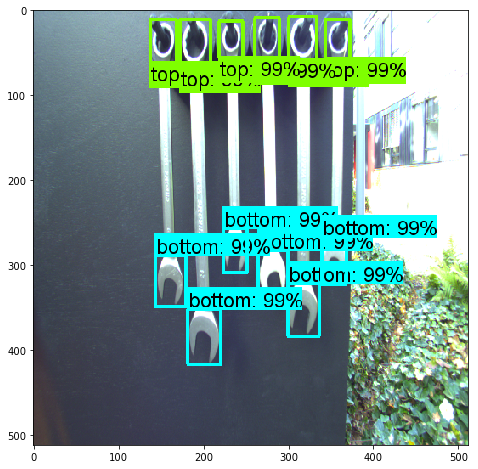

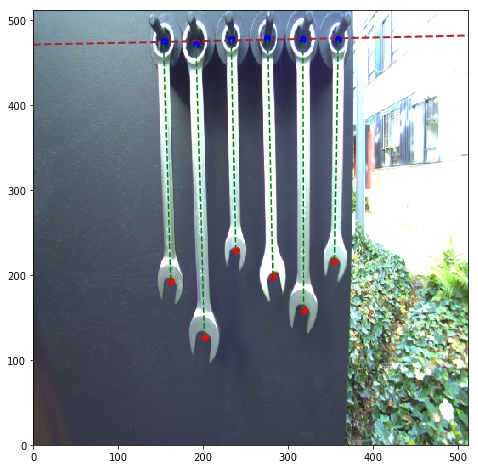

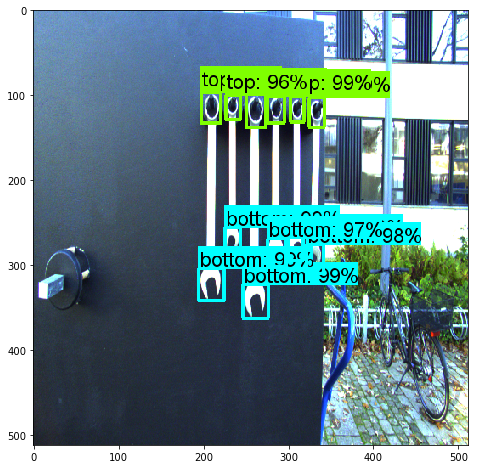

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


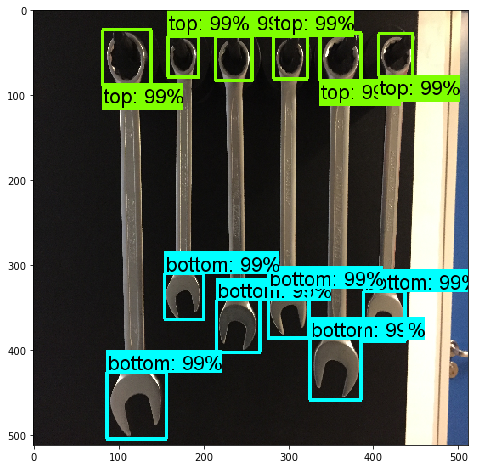

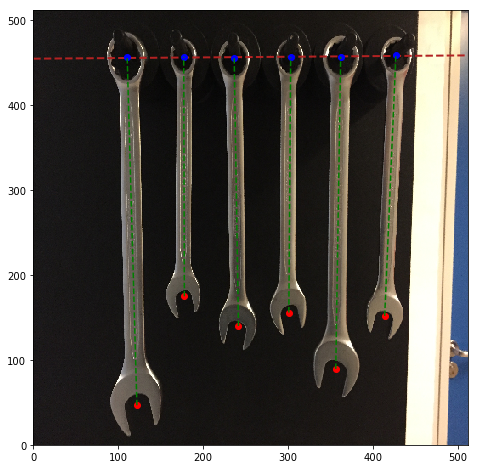

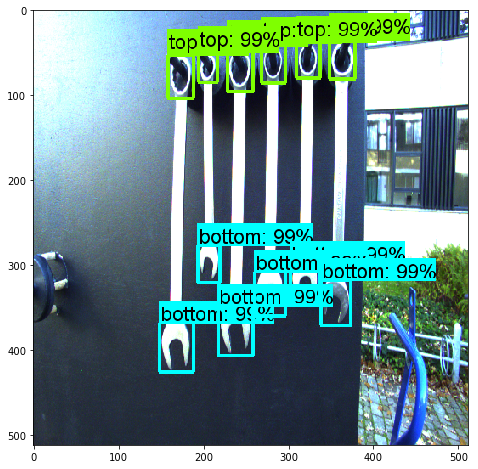

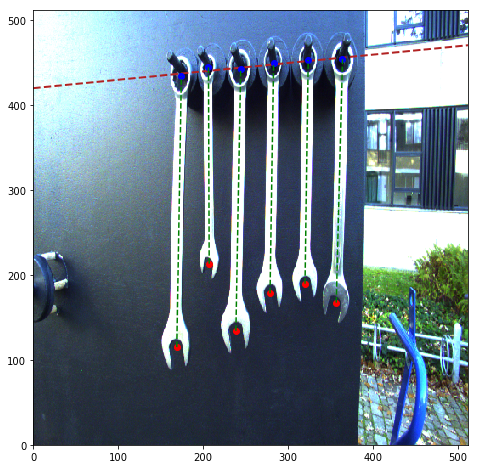

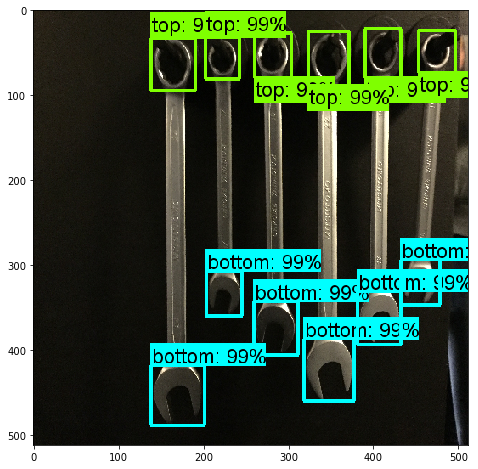

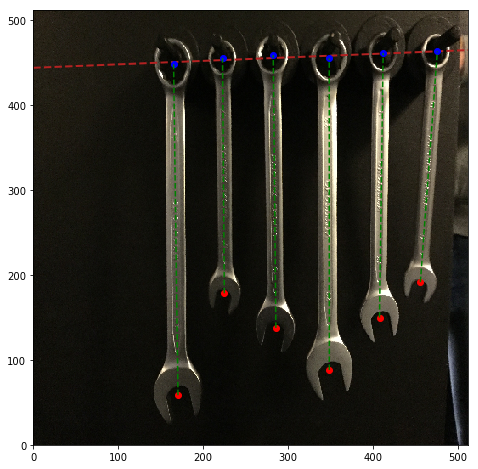

In [234]:
overall_acc = 0
val_16 = 0
val_17 = 0
val_18 = 0
val_19 = 0
val_22 = 0
val_24 = 0

with detection_graph.as_default():
  with tf.Session(graph=detection_graph) as sess:
    # Definite input and output Tensors for detection_graph
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    # Each box represents a part of the image where a particular object was detected.
    detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
    # Each score represent how level of confidence for each of the objects.
    # Score is shown on the result image, together with the class label.
    detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
    detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    for image_path in TEST_IMAGE_PATHS:
      image = Image.open(image_path)
      # the array based representation of the image will be used later in order to prepare the
      # result image with boxes and labels on it.
      image_np = load_image_into_numpy_array(image)
      # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
      image_np_expanded = np.expand_dims(image_np, axis=0)
      # Actual detection.
      (boxes, scores, classes, num) = sess.run(
          [detection_boxes, detection_scores, detection_classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
      # Visualization of the results of a detection.
      vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          np.squeeze(boxes),
          np.squeeze(classes).astype(np.int32),
          np.squeeze(scores),
          category_index,
          use_normalized_coordinates=True,
          line_thickness=4, 
          min_score_thresh = 0.85)
      print(image_path)
      plt.figure(figsize=IMAGE_SIZE)
      plt.imshow(image_np)
    
      pred_box = boxes[(scores)>0.85]
      pred_classes = classes[(scores)>0.85]
      # 1 is top, 2 is bottom
      # ymin xmin ymax xmax
      
      centy = pred_box[:,0]+(pred_box[:,2]-pred_box[:,0])/2
      centx = pred_box[:,1]+(pred_box[:,3]-pred_box[:,1])/2
      
      centy_bot = centy[pred_classes==2]
      centy_top = centy[pred_classes==1]
      centx_bot = centx[pred_classes==2]
      centx_top = centx[pred_classes==1]
      
      sortIdx_bot = np.argsort(centx[pred_classes==2])
      sortIdx_top = np.argsort(centx[pred_classes==1])
  
      [a,b] = np.polyfit(centx_top[sortIdx_top],centy_top[sortIdx_top],1)
      centx_top[sortIdx_top]
      centy_top2 = b-centx_top[sortIdx_top]*a
      
      base = Image.open(image_path)
      fig, ax = plt.subplots(figsize=IMAGE_SIZE)
      x = [0, 512]
      y = [512-b*512, 512-(b*512+a*512)]
      ax.imshow(base, extent=[0, 512, 0, 512])
      ax.plot(x, y, '--', linewidth=2, color='firebrick')
      ax.plot(centx_top[sortIdx_top]*512,512-centy_top[sortIdx_top]*512, 'bo')
      ax.plot(centx_bot[sortIdx_bot]*512,512-centy_bot[sortIdx_bot]*512, 'ro')
      dist = []
      for i in range(0,6):
          #x1 = 512*np.min([centx_bot[sortIdx_bot][i], centx_top[sortIdx_top][i]]), 512*np.max([centx_bot[sortIdx_bot][i], centx_top[sortIdx_top][i]])
          x1 = (512*centx_bot[sortIdx_bot][i], 512*centx_top[sortIdx_top][i])
          #y1 = 512-512*np.min([centy_bot[sortIdx_bot][i], centy_top[sortIdx_top][i]]), 512-512*np.max([centy_bot[sortIdx_bot][i], centy_top[sortIdx_top][i]])
          y1 = (512-512*centy_bot[sortIdx_bot][i], 512-512*centy_top[sortIdx_top][i])
          ax.plot(x1,y1,'--',color='green')
          dist.append(math.hypot(x1[1] - x1[0], y1[1] - y1[0]))
      
      # Sorting sizes to get positions. 
      sortIdx_size = np.argsort(dist)
      
      val_tot = 0
      for i in range(0,6):
          print('Pos %d length: %.2f. Predicted as %d, true value was %d.' % (i+1,dist[i], size2key(indices(sortIdx_size, lambda x: x == i)[0]),int(image_path[12+i*3:14+i*3])))
          val_tot += 1*size2key(indices(sortIdx_size, lambda x: x == i)[0]) == int(image_path[12+i*3:14+i*3])
          val_16 += 1*size2key(indices(sortIdx_size, lambda x: x == i)[0]) == int(image_path[12+i*3:14+i*3]) == 16
          val_17 += 1*size2key(indices(sortIdx_size, lambda x: x == i)[0]) == int(image_path[12+i*3:14+i*3]) == 17
          val_18 += 1*size2key(indices(sortIdx_size, lambda x: x == i)[0]) == int(image_path[12+i*3:14+i*3]) == 18
          val_19 += 1*size2key(indices(sortIdx_size, lambda x: x == i)[0]) == int(image_path[12+i*3:14+i*3]) == 19
          val_22 += 1*size2key(indices(sortIdx_size, lambda x: x == i)[0]) == int(image_path[12+i*3:14+i*3]) == 22
          val_24 += 1*size2key(indices(sortIdx_size, lambda x: x == i)[0]) == int(image_path[12+i*3:14+i*3]) == 24

      print('\nAccuracy was %.2f%%\n' % (val_tot/6*100))
      overall_acc += val_tot/6
      print('--------------------------------------------------------\n')

In [247]:
print('---------- Final statistics on test set: ----------')
print('Of %d images with each 6 keys:\n' % (np.shape(TEST_IMAGE_PATHS)[0]))
print('- Accuracy key 16: %.2f%%' % (val_16/np.shape(TEST_IMAGE_PATHS)[0]*100))
print('- Accuracy key 17: %.2f%%' % (val_17/np.shape(TEST_IMAGE_PATHS)[0]*100))
print('- Accuracy key 18: %.2f%%' % (val_18/np.shape(TEST_IMAGE_PATHS)[0]*100))
print('- Accuracy key 19: %.2f%%' % (val_19/np.shape(TEST_IMAGE_PATHS)[0]*100))
print('- Accuracy key 22: %.2f%%' % (val_22/np.shape(TEST_IMAGE_PATHS)[0]*100))
print('- Accuracy key 24: %.2f%%\n' % (val_24/np.shape(TEST_IMAGE_PATHS)[0]*100))
print('The total accuracy is %.2f%%' % ((overall_acc)/np.shape(TEST_IMAGE_PATHS)[0]*100))

---------- Final statistics on test set: ----------
Of 36 images with each 6 keys:

- Accuracy key 16: 97.22%
- Accuracy key 17: 80.56%
- Accuracy key 18: 72.22%
- Accuracy key 19: 86.11%
- Accuracy key 22: 94.44%
- Accuracy key 24: 97.22%

The total accuracy is 87.96%
